In [1]:
import numpy as np
from time_series_utils import TS_generator, scale_min_max, weight_ts
from sklearn.preprocessing import MinMaxScaler
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
LONG_HISTORY = 60
SHORT_HISTORY = 20

In [3]:
ts_generator = TS_generator(nb_timeseries=10000, chunk_size=LONG_HISTORY)

In [4]:
X = ts_generator.get_array()

In [13]:
X = scale_min_max(X)

# alpha = 1.05 for a 60 day history gives the 60th day(back in history) 20 times more weight that 1st day
weights_long, time_series_long = weight_ts(X, reverse=True, alpha=1.04)
# alpha = 1.2 for a 20 day history gives the 1st(back in history) day 40 times more weight that 20th day 
weights_short, time_series_short = weight_ts(X[:, (LONG_HISTORY-SHORT_HISTORY):], alpha = 1.2)

## Remove the time series with nans

# 1. get the interscection of non-nan indices
nan_indices_long = np.unique(np.argwhere(np.isnan(time_series_long))[:, 0])
nan_indices_short = np.unique(np.argwhere(np.isnan(time_series_short))[:, 0])


X = np.delete(X, nan_indices_long, 0)
time_series_long = np.delete(time_series_long, nan_indices_long, 0)
time_series_short = np.delete(time_series_short, nan_indices_short, 0)


In [16]:
n_clusters = 10
clu = KMeans(n_clusters=n_clusters, random_state=0)
clu.fit(time_series_long)
labels_long = clu.labels_

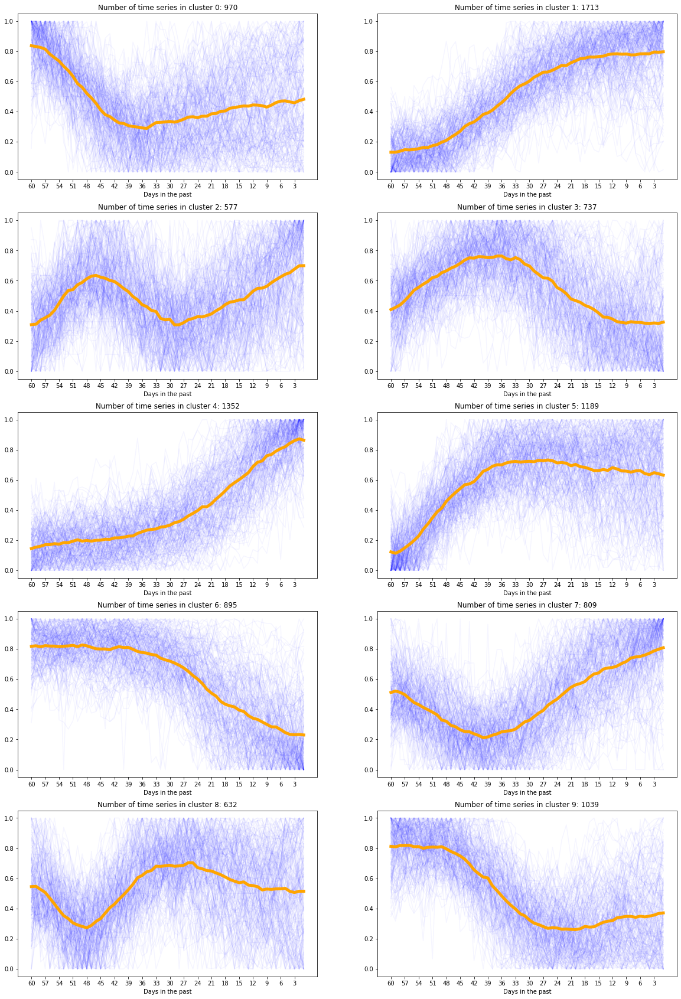

In [19]:
fig, axes = plt.subplots(n_clusters//2, 2,figsize=(20,30))
axes_list = list(axes.flatten())

for cluster_nb in range(n_clusters):
    indices1 = [i for i,x in enumerate(labels_long) if x == cluster_nb]
    indices2 = np.random.choice(indices1, size=200, replace=False)
    cluster_center = X[indices2].mean(0)
    ax = axes_list[cluster_nb]
    ax.title.set_text('Number of time series in cluster ' + str(cluster_nb) + ': ' + str(len(indices1)))
    for i in range(len(indices2)):
        ax.plot(X[indices2[i]], alpha=0.04, color='b')
        ax.set_xticks(np.arange(0, LONG_HISTORY, 3))
        ax.set_xticklabels(np.arange(LONG_HISTORY, 0, -3))
        ax.set_xlabel("Days in the past")
    ax.plot(cluster_center,color='orange',linewidth=5,alpha=1,label="center"+str(cluster_nb))
# plt.savefig(''.join([str(LONG_HISTORY)]), dpi=300)

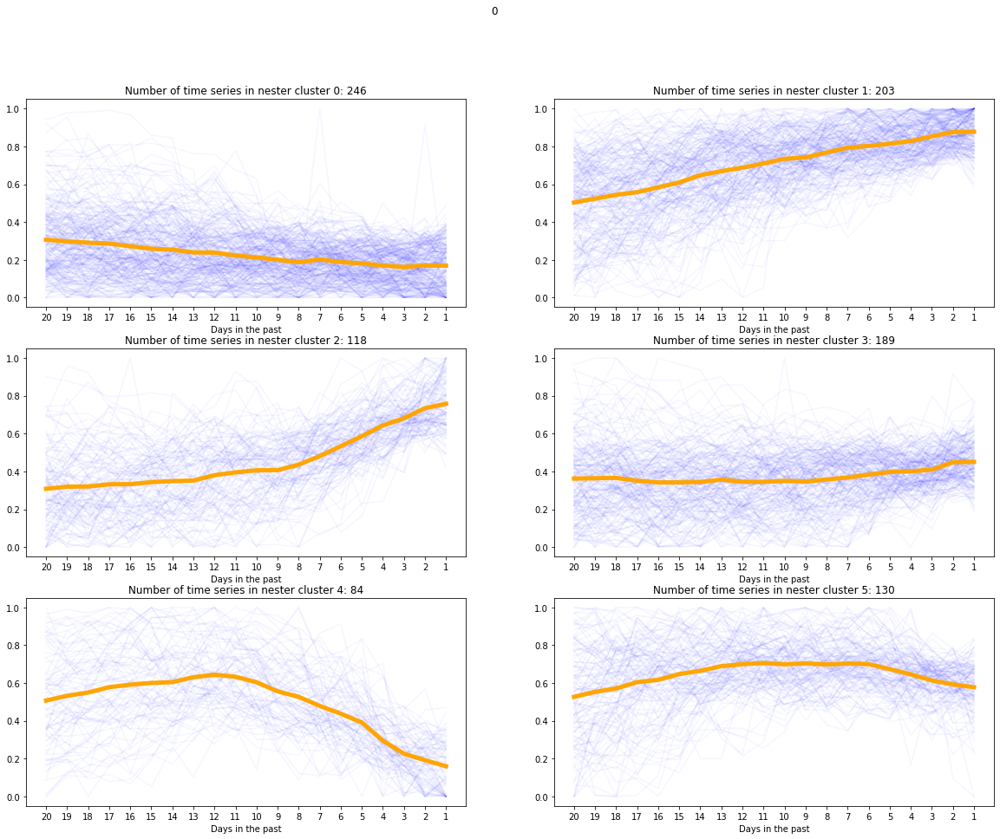

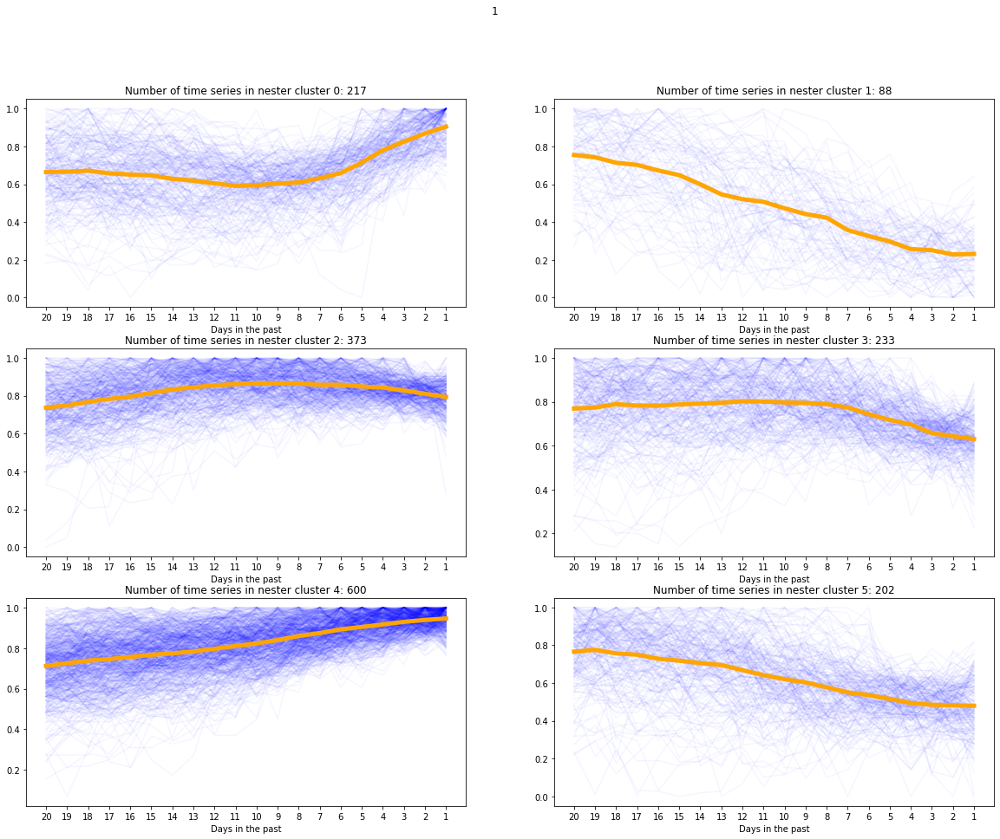

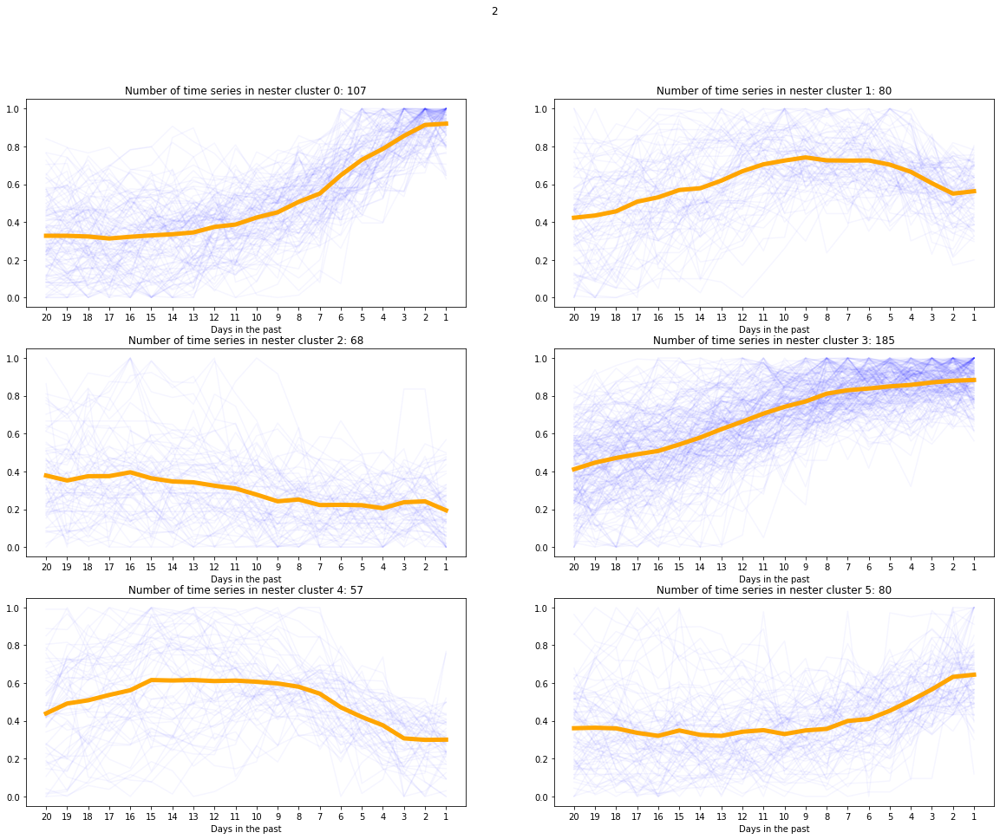

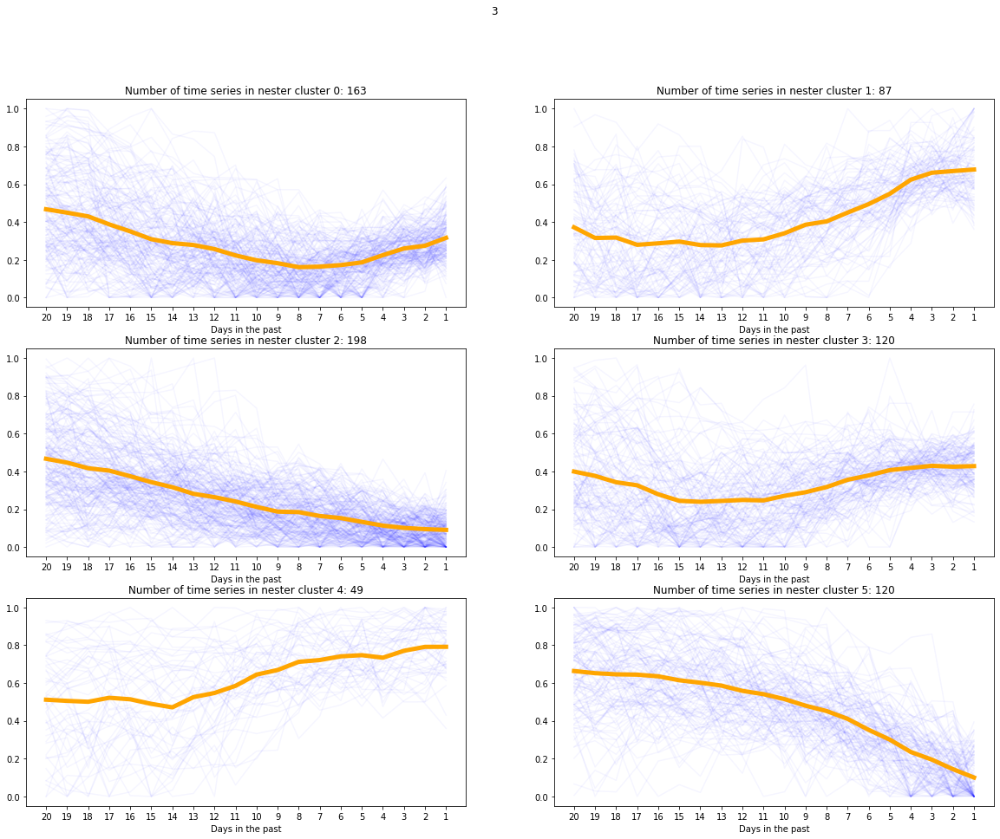

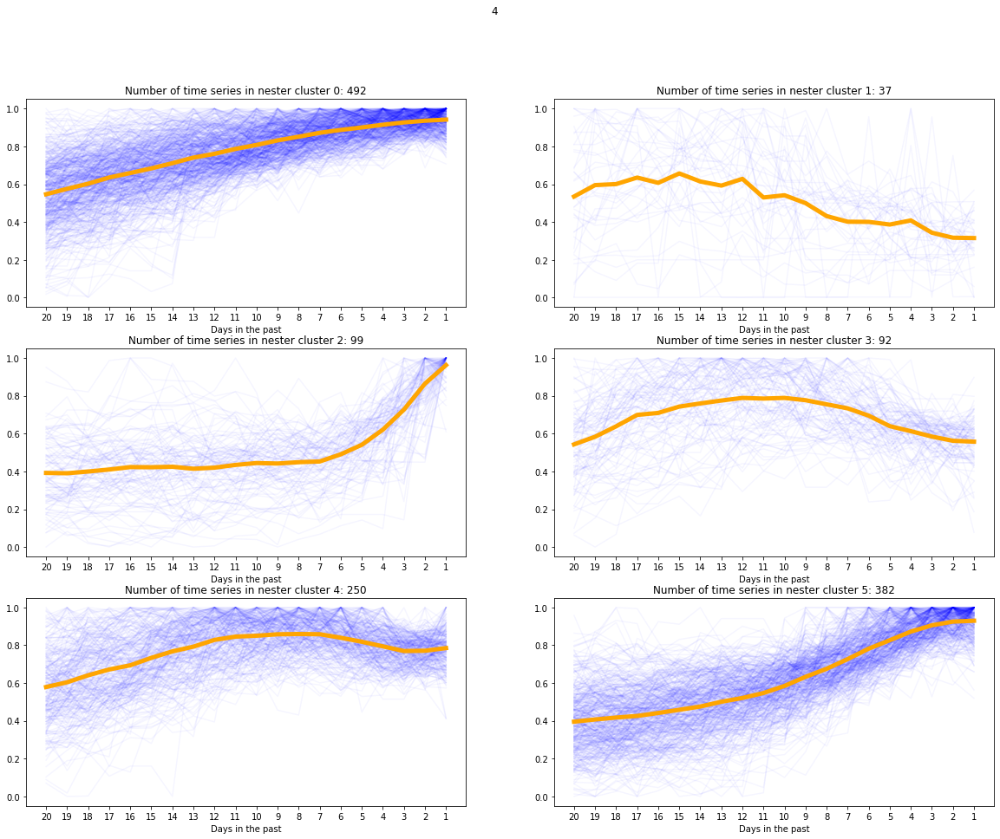

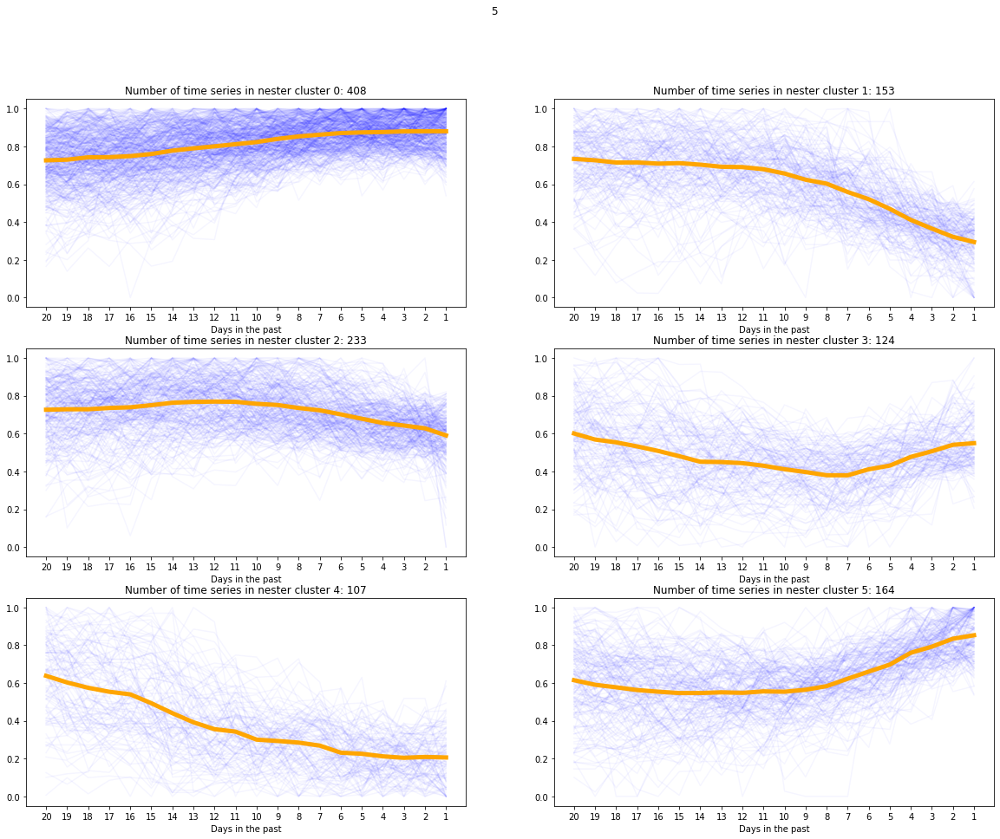

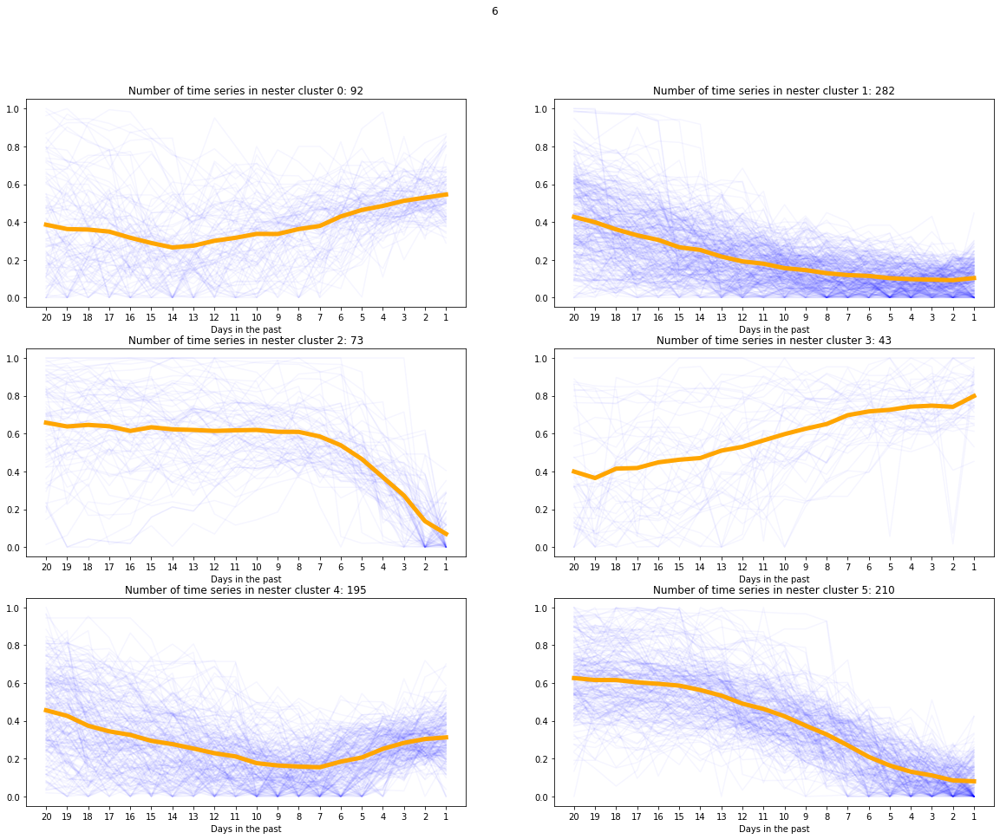

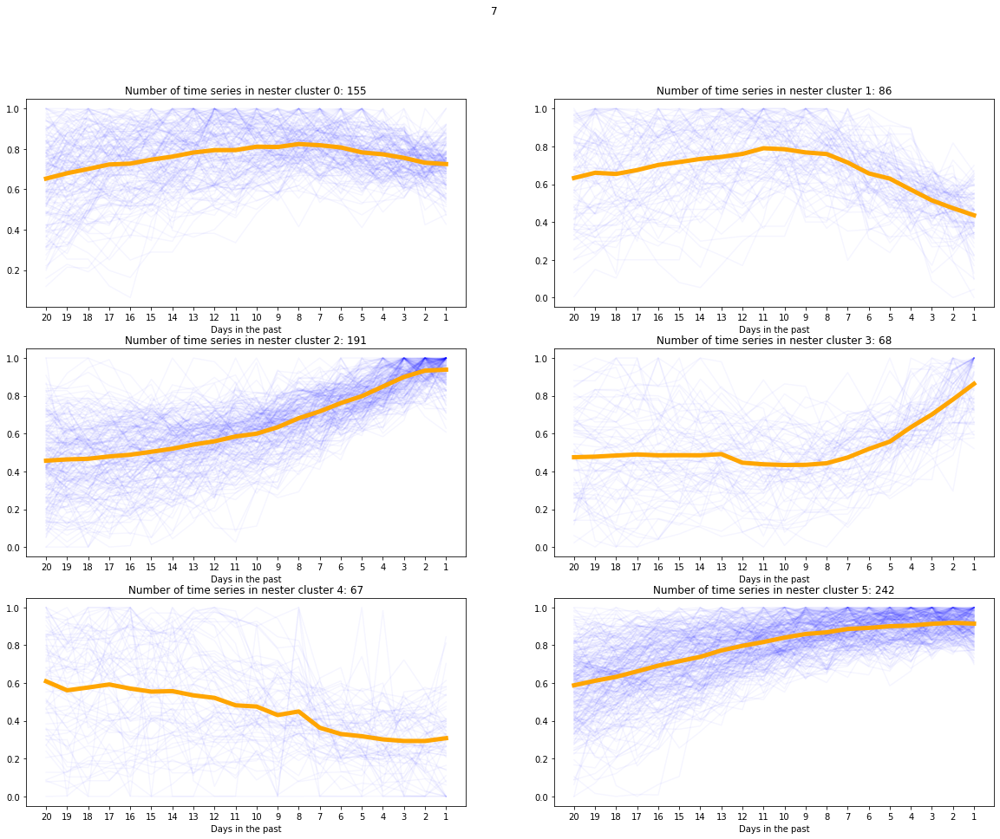

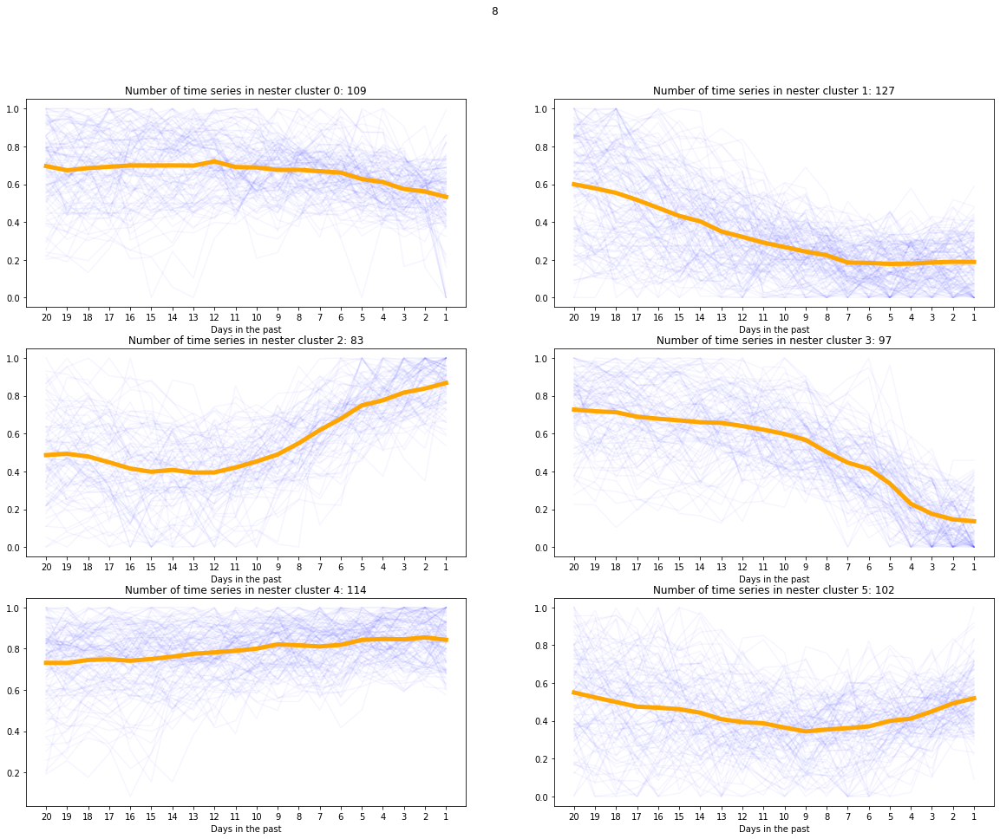

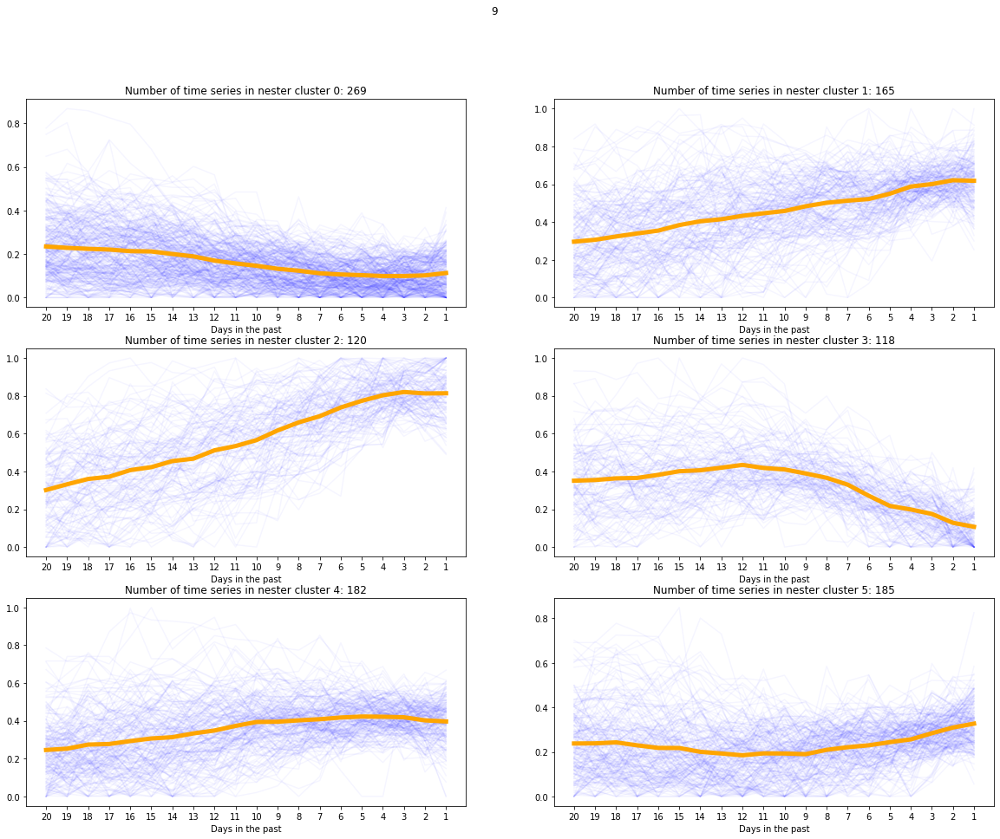

In [30]:
n_clusters_nested = 6
for cluster_nb in range(n_clusters):
    indices = [i for i,x in enumerate(labels_long) if x == cluster_nb]
    X_original, X_cluster = X[:, (LONG_HISTORY-SHORT_HISTORY):][indices], time_series_short[indices]
    clu = KMeans(n_clusters=n_clusters_nested, random_state=0)
    clu.fit(X_cluster)
    labels = clu.labels_
    fig, axes = plt.subplots((n_clusters_nested+1)//2, 2,figsize=(20, 15))
    fig.suptitle(str(cluster_nb))
    axes_list = list(axes.flatten())
    for cluster_nb_nested in range(n_clusters_nested):
        indices1 = [i for i,x in enumerate(labels) if x == cluster_nb_nested]
        cluster_center = X_original[indices1].mean(0)
        ax = axes_list[cluster_nb_nested]
        ax.title.set_text('Number of time series in nester cluster ' + str(cluster_nb_nested) + ': ' + str(len(indices1)))
        for i in range(len(indices1)):
            ax.plot(X_original[indices1[i]], alpha=0.04, color='b')
            ax.set_xticks(np.arange(0, SHORT_HISTORY))
            ax.set_xticklabels(np.arange(SHORT_HISTORY, 0, -1))
            ax.set_xlabel("Days in the past")
        ax.plot(cluster_center,color='orange',linewidth=5,alpha=1,label="center"+str(cluster_nb_nested))
